<a href="https://colab.research.google.com/github/ThuyHaLE/ThuyHaLE/blob/main/Data_processing_using_the_AIP_command_(Kaggle)_and_Polars.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Import some libraries

In [ ]:
!pip install ipython-autotime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 17.9 MB/s eta 0:00:00


In [ ]:
%load_ext autotime

time: 336 µs (started: 2023-06-11 06:58:13 +00:00)


In [ ]:
%time

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.15 µs
time: 2.24 ms (started: 2023-06-11 06:58:15 +00:00)


In [ ]:
import os 
#To create a Kaggle environment in Colab:
#Step 1: sign up for a Kaggle account at https://www.kaggle.com
#Step 2: select 'Create API Token' in profile settings (https://www.kaggle.com/settings)
#Step 3: download kaggle.json (it includes your username and key)
os.environ['KAGGLE_USERNAME'] = '' # username from the json file
os.environ['KAGGLE_KEY'] = '' # key from the json file

time: 692 µs (started: 2023-06-11 08:18:57 +00:00)


In [ ]:
!pip install polars

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 6.33 s (started: 2023-06-11 07:35:46 +00:00)


In [ ]:
import polars as pl

time: 216 ms (started: 2023-06-11 07:35:52 +00:00)


#World Food Facts from Kaggle dataset (Pandas)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive
time: 29.6 s (started: 2023-06-11 07:23:46 +00:00)


In [ ]:
root_dir = '/content/drive/MyDrive/2023-Projects/Competition'
directory_1 = 'world-food-facts'
path = os.path.join(root_dir, directory_1)
os.makedirs(path, exist_ok = True)

time: 2.71 ms (started: 2023-06-11 07:32:29 +00:00)


In [ ]:
%cd '/content/drive/MyDrive/2023-Projects/Competition/world-food-facts'

/content/drive/MyDrive/2023-Projects/Competition/world-food-facts
time: 3.2 ms (started: 2023-06-11 07:33:01 +00:00)


In [ ]:
#Get AIP command from Kaggle:
#Step1: Search a suitable dataset (https://www.kaggle.com/datasets)
#Step2: Access and copy the AIP command
!kaggle datasets download -d openfoodfacts/world-food-facts #AIP command

 98% 107M/109M [00:04<00:00, 27.9MB/s]
100% 109M/109M [00:04<00:00, 24.2MB/s]
time: 5.94 s (started: 2023-06-11 07:34:11 +00:00)


In [ ]:
!unzip world-food-facts.zip 

Archive:  world-food-facts.zip
  inflating: en.openfoodfacts.org.products.tsv  
time: 31.9 s (started: 2023-06-11 07:34:20 +00:00)


In [ ]:
import pandas as pd

time: 519 µs (started: 2023-06-11 08:10:33 +00:00)


In [ ]:
#Load dataset
world_food_facts_df = pd.read_csv("en.openfoodfacts.org.products.tsv", sep='\t')

<ipython-input-45-e1481b599a53>:1: DtypeWarning: Columns (0,3,5,19,20,24,25,26,27,28,36,37,38,39,48) have mixed types. Specify dtype option on import or set low_memory=False.
  world_food_facts_df = pd.read_csv("en.openfoodfacts.org.products.tsv", sep='\t')


time: 25.5 s (started: 2023-06-11 08:15:07 +00:00)


In [ ]:
world_food_facts_df.describe() #describe dataset

,no_nutriments,additives_n,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,nutrition_grade_uk,energy_100g,energy-from-fat_100g,fat_100g,...,fruits-vegetables-nuts_100g,fruits-vegetables-nuts-estimate_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
count,0.0,283867.000000,283867.000000,0.0,283867.000000,0.0,0.0,295367.000000,869.000000,2.794970e+05,...,3228.000000,404.000000,182.000000,1383.000000,0.0,278.000000,254856.000000,254856.000000,0.0,0.0
mean,NaN,1.876851,0.023430,NaN,0.059736,NaN,NaN,1125.453320,587.216617,5.606587e+04,...,33.392680,60.360124,15.362637,52.102675,NaN,335.790664,9.166137,8.980656,NaN,NaN
std,NaN,2.501022,0.153094,NaN,0.280660,NaN,NaN,936.825952,713.255708,2.963385e+07,...,32.906834,29.262350,3.692658,19.028361,NaN,423.244817,8.999870,9.151757,NaN,NaN
min,NaN,0.000000,0.000000,NaN,0.000000,NaN,NaN,0.000000,0.000000,0.000000e+00,...,0.000000,0.000000,8.000000,6.000000,NaN,0.000000,-15.000000,-15.000000,NaN,NaN
25%,NaN,0.000000,0.000000,NaN,0.000000,NaN,NaN,382.000000,49.400000,1.000000e-01,...,0.000000,45.000000,12.000000,33.000000,NaN,82.650000,1.000000,1.000000,NaN,NaN
50%,NaN,1.000000,0.000000,NaN,0.000000,NaN,NaN,1092.000000,300.000000,5.290000e+00,...,25.000000,58.000000,15.000000,52.000000,NaN,190.950000,10.000000,9.000000,NaN,NaN
75%,NaN,3.000000,0.000000,NaN,0.000000,NaN,NaN,1674.000000,900.000000,2.000000e+01,...,55.000000,93.000000,15.000000,70.000000,NaN,378.700000,16.000000,16.000000,NaN,NaN
max,NaN,30.000000,2.000000,NaN,6.000000,NaN,NaN,231199.000000,3830.000000,1.566667e+10,...,100.000000,100.000000,25.000000,100.000000,NaN,2842.000000,40.000000,40.000000,NaN,NaN


time: 2.44 s (started: 2023-06-11 08:16:16 +00:00)


In [ ]:
world_food_facts_df.head(5) #show 5 first rows

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,fruits-vegetables-nuts_100g,fruits-vegetables-nuts-estimate_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,3087,http://world-en.openfoodfacts.org/product/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4530,http://world-en.openfoodfacts.org/product/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,14.0,14.0,NaN,NaN
2,4559,http://world-en.openfoodfacts.org/product/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
3,16087,http://world-en.openfoodfacts.org/product/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,12.0,NaN,NaN
4,16094,http://world-en.openfoodfacts.org/product/0000...,usda-ndb-import,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z,Organic Polenta,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


time: 31 ms (started: 2023-06-11 08:15:33 +00:00)


#2023 world population by country from Kaggle dataset (Polars)

In [ ]:
root_dir = '/content/drive/MyDrive/2023-Projects/Competition'
directory_3 = '2023-world-population-by-country'
path = os.path.join(root_dir, directory_3)
os.makedirs(path, exist_ok = True)

time: 6.87 ms (started: 2023-06-11 08:40:19 +00:00)


In [ ]:
%cd '/content/drive/MyDrive/2023-Projects/Competition/2023-world-population-by-country'

/content/drive/MyDrive/2023-Projects/Competition/2023-world-population-by-country
time: 4.8 ms (started: 2023-06-11 08:40:21 +00:00)


In [ ]:
!kaggle datasets download -d rajkumarpandey02/2023-world-population-by-country

  0% 0.00/38.4k [00:00<?, ?B/s]
100% 38.4k/38.4k [00:00<00:00, 1.71MB/s]
time: 1.01 s (started: 2023-06-11 08:40:24 +00:00)


In [ ]:
!unzip 2023-world-population-by-country.zip

Archive:  2023-world-population-by-country.zip
  inflating: countries-table.csv     
  inflating: countries-table.json    
time: 113 ms (started: 2023-06-11 08:41:11 +00:00)


In [ ]:
#Load dataset
world_population_df = pl.read_json('/content/drive/MyDrive/2023-Projects/Competition/2023-world-population-by-country/countries-table.json')

time: 12.8 ms (started: 2023-06-11 08:44:18 +00:00)


In [ ]:
world_population_df.head(5) #show 5 first rows

place,pop1980,pop2000,pop2010,pop2022,pop2023,pop2030,pop2050,country,area,landAreaKm,cca2,cca3,netChange,growthRate,worldPercentage,density,densityMi,rank
i64,f64,f64,f64,f64,f64,f64,f64,str,f64,f64,str,str,f64,f64,f64,f64,f64,i64
356,6.96828385e8,1.0596e9,1.2406e9,1.4172e9,1.4286e9,1.5150e9,1.6705e9,"""India""",3.28759e6,2.97319e6,"""IN""","""IND""",0.4184,0.0081,0.1785,480.5033,1244.5036,1
156,9.82372466e8,1.2641e9,1.3482e9,1.4259e9,1.4257e9,1.4156e9,1.3126e9,"""China""",9.706961e6,9424702.9,"""CN""","""CHN""",-0.0113,-0.0002,0.1781,151.2696,391.7884,2
840,2.23140018e8,2.82398554e8,3.11182845e8,3.38289857e8,3.39996563e8,3.52162301e8,3.75391963e8,"""United States""",9.37261e6,9.14742e6,"""US""","""USA""",0.0581,0.005,0.0425,37.1686,96.2666,3
360,1.48177096e8,2.14072421e8,2.44016173e8,2.75501339e8,2.77534122e8,2.921501e8,3.17225213e8,"""Indonesia""",1.904569e6,1.877519e6,"""ID""","""IDN""",0.0727,0.0074,0.0347,147.8196,382.8528,4
586,8.0624057e7,1.54369924e8,1.94454498e8,2.35824862e8,2.40485658e8,2.74029836e8,3.67808468e8,"""Pakistan""",881912.0,770880.0,"""PK""","""PAK""",0.1495,0.0198,0.03,311.9625,807.9829,5


time: 7.58 ms (started: 2023-06-11 08:44:33 +00:00)


In [ ]:
world_population_df.tail(5) #show 5 last rows

place,pop1980,pop2000,pop2010,pop2022,pop2023,pop2030,pop2050,country,area,landAreaKm,cca2,cca3,netChange,growthRate,worldPercentage,density,densityMi,rank
i64,f64,f64,f64,f64,f64,f64,f64,str,f64,f64,str,str,f64,f64,f64,f64,f64,i64
500,11452.0,5138.0,4938.0,4390.0,4386.0,4301.0,3781.0,"""Montserrat""",102.0,102.0,"""MS""","""MSR""",null,-0.0009,null,43.0,111.37,230
238,2240.0,3080.0,3187.0,3780.0,3791.0,3869.0,3779.0,"""Falkland Islan…",12173.0,12173.0,"""FK""","""FLK""",null,0.0029,null,0.3114,0.8066,231
570,3637.0,2074.0,1812.0,1934.0,1935.0,1948.0,2096.0,"""Niue""",261.0,261.0,"""NU""","""NIU""",0.0,0.0005,null,7.4138,19.2017,232
772,1647.0,1666.0,1367.0,1871.0,1893.0,2046.0,2430.0,"""Tokelau""",12.0,10.0,"""TK""","""TKL""",null,0.0118,null,189.3,490.287,233
336,733.0,651.0,596.0,510.0,518.0,561.0,731.0,"""Vatican City""",0.44,0.44,"""VA""","""VAT""",null,0.0157,null,1177.2727,3049.1364,234


time: 8.83 ms (started: 2023-06-11 08:55:54 +00:00)


In [ ]:
world_population_df.select(pl.col(["pop2022", "pop2023"])).head(5) #show only 2 columns named "pop2022", "pop2023" (5 first rows)

pop2022,pop2023
f64,f64
1.4172e9,1.4286e9
1.4259e9,1.4257e9
3.38289857e8,3.39996563e8
2.75501339e8,2.77534122e8
2.35824862e8,2.40485658e8


time: 8.5 ms (started: 2023-06-11 08:51:50 +00:00)


In [ ]:
world_population_df.select(pl.col("*")).head(5) #show only all columns (5 first rows)

place,pop1980,pop2000,pop2010,pop2022,pop2023,pop2030,pop2050,country,area,landAreaKm,cca2,cca3,netChange,growthRate,worldPercentage,density,densityMi,rank
i64,f64,f64,f64,f64,f64,f64,f64,str,f64,f64,str,str,f64,f64,f64,f64,f64,i64
356,6.96828385e8,1.0596e9,1.2406e9,1.4172e9,1.4286e9,1.5150e9,1.6705e9,"""India""",3.28759e6,2.97319e6,"""IN""","""IND""",0.4184,0.0081,0.1785,480.5033,1244.5036,1
156,9.82372466e8,1.2641e9,1.3482e9,1.4259e9,1.4257e9,1.4156e9,1.3126e9,"""China""",9.706961e6,9424702.9,"""CN""","""CHN""",-0.0113,-0.0002,0.1781,151.2696,391.7884,2
840,2.23140018e8,2.82398554e8,3.11182845e8,3.38289857e8,3.39996563e8,3.52162301e8,3.75391963e8,"""United States""",9.37261e6,9.14742e6,"""US""","""USA""",0.0581,0.005,0.0425,37.1686,96.2666,3
360,1.48177096e8,2.14072421e8,2.44016173e8,2.75501339e8,2.77534122e8,2.921501e8,3.17225213e8,"""Indonesia""",1.904569e6,1.877519e6,"""ID""","""IDN""",0.0727,0.0074,0.0347,147.8196,382.8528,4
586,8.0624057e7,1.54369924e8,1.94454498e8,2.35824862e8,2.40485658e8,2.74029836e8,3.67808468e8,"""Pakistan""",881912.0,770880.0,"""PK""","""PAK""",0.1495,0.0198,0.03,311.9625,807.9829,5


time: 9.32 ms (started: 2023-06-11 08:52:10 +00:00)


In [ ]:
world_population_df.select([pl.col("pop2030"), pl.col("pop2050")]).limit(5) #show only 2 columns named "pop2030", "pop2050" (5 first rows)

pop2030,pop2050
f64,f64
1.5150e9,1.6705e9
1.4156e9,1.3126e9
3.52162301e8,3.75391963e8
2.921501e8,3.17225213e8
2.74029836e8,3.67808468e8


time: 5.9 ms (started: 2023-06-11 08:58:08 +00:00)


In [ ]:
world_population_df.select([pl.exclude("pop2030",'pop2050')]).limit(5) #dont show columns named "pop2023" and "pop2050" (5 first rows)

place,pop1980,pop2000,pop2010,pop2022,pop2023,country,area,landAreaKm,cca2,cca3,netChange,growthRate,worldPercentage,density,densityMi,rank
i64,f64,f64,f64,f64,f64,str,f64,f64,str,str,f64,f64,f64,f64,f64,i64
356,6.96828385e8,1.0596e9,1.2406e9,1.4172e9,1.4286e9,"""India""",3.28759e6,2.97319e6,"""IN""","""IND""",0.4184,0.0081,0.1785,480.5033,1244.5036,1
156,9.82372466e8,1.2641e9,1.3482e9,1.4259e9,1.4257e9,"""China""",9.706961e6,9424702.9,"""CN""","""CHN""",-0.0113,-0.0002,0.1781,151.2696,391.7884,2
840,2.23140018e8,2.82398554e8,3.11182845e8,3.38289857e8,3.39996563e8,"""United States""",9.37261e6,9.14742e6,"""US""","""USA""",0.0581,0.005,0.0425,37.1686,96.2666,3
360,1.48177096e8,2.14072421e8,2.44016173e8,2.75501339e8,2.77534122e8,"""Indonesia""",1.904569e6,1.877519e6,"""ID""","""IDN""",0.0727,0.0074,0.0347,147.8196,382.8528,4
586,8.0624057e7,1.54369924e8,1.94454498e8,2.35824862e8,2.40485658e8,"""Pakistan""",881912.0,770880.0,"""PK""","""PAK""",0.1495,0.0198,0.03,311.9625,807.9829,5


time: 5.64 ms (started: 2023-06-11 09:03:45 +00:00)


In [ ]:
# filter 
world_population_df.filter(pl.col("pop2023").is_between(1e8, 1e9)) #filter: 100,000,000 < pop2023 < 1,000,000,000

place,pop1980,pop2000,pop2010,pop2022,pop2023,pop2030,pop2050,country,area,landAreaKm,cca2,cca3,netChange,growthRate,worldPercentage,density,densityMi,rank
i64,f64,f64,f64,f64,f64,f64,f64,str,f64,f64,str,str,f64,f64,f64,f64,f64,i64
840,2.23140018e8,2.82398554e8,3.11182845e8,3.38289857e8,3.39996563e8,3.52162301e8,3.75391963e8,"""United States""",9.37261e6,9.14742e6,"""US""","""USA""",0.0581,0.005,0.0425,37.1686,96.2666,3
360,1.48177096e8,2.14072421e8,2.44016173e8,2.75501339e8,2.77534122e8,2.921501e8,3.17225213e8,"""Indonesia""",1.904569e6,1.877519e6,"""ID""","""IDN""",0.0727,0.0074,0.0347,147.8196,382.8528,4
586,8.0624057e7,1.54369924e8,1.94454498e8,2.35824862e8,2.40485658e8,2.74029836e8,3.67808468e8,"""Pakistan""",881912.0,770880.0,"""PK""","""PAK""",0.1495,0.0198,0.03,311.9625,807.9829,5
566,7.2951439e7,1.22851984e8,1.60952853e8,2.18541212e8,2.23804632e8,2.6258e8,3.77459883e8,"""Nigeria""",923768.0,910770.0,"""NG""","""NGA""",0.168,0.0241,0.028,245.7312,636.4439,6
76,1.22288383e8,1.7587372e8,1.96353492e8,2.15313498e8,2.16422446e8,2.23908968e8,2.30885725e8,"""Brazil""",8.515767e6,8.35814e6,"""BR""","""BRA""",0.0393,0.0052,0.027,25.8936,67.0645,7
50,8.3929765e7,1.29193327e8,1.48391139e8,1.71186372e8,1.72954319e8,1.84424144e8,2.039049e8,"""Bangladesh""",147570.0,130170.0,"""BD""","""BGD""",0.0557,0.0103,0.0216,1328.6803,3441.2821,8
643,1.3825742e8,1.46844839e8,1.43242599e8,1.44713314e8,1.44444359e8,1.41432741e8,1.33133035e8,"""Russia""",1.7098242e7,1.637687e7,"""RU""","""RUS""",-0.0158,-0.0019,0.018,8.82,22.8439,9
484,6.7705186e7,9.7873442e7,1.12532401e8,1.27504125e8,1.28455567e8,1.34534107e8,1.43772364e8,"""Mexico""",1.964375e6,1.94395e6,"""MX""","""MEX""",0.0299,0.0075,0.016,66.0797,171.1463,10
231,3.4945469e7,6.7031867e7,8.9237791e7,1.23379924e8,1.2652706e8,1.49296378e8,2.14812309e8,"""Ethiopia""",1.1043e6,1128571.3,"""ET""","""ETH""",0.1008,0.0255,0.0158,112.1126,290.3716,11


time: 15 ms (started: 2023-06-11 09:06:02 +00:00)


In [ ]:
world_population_df.filter((pl.col("rank") < 10) & (pl.col("pop2023").is_not_nan())) #filter: top 10 countries and popu 2023 is not null

place,pop1980,pop2000,pop2010,pop2022,pop2023,pop2030,pop2050,country,area,landAreaKm,cca2,cca3,netChange,growthRate,worldPercentage,density,densityMi,rank
i64,f64,f64,f64,f64,f64,f64,f64,str,f64,f64,str,str,f64,f64,f64,f64,f64,i64
356,6.96828385e8,1.0596e9,1.2406e9,1.4172e9,1.4286e9,1.5150e9,1.6705e9,"""India""",3.28759e6,2.97319e6,"""IN""","""IND""",0.4184,0.0081,0.1785,480.5033,1244.5036,1
156,9.82372466e8,1.2641e9,1.3482e9,1.4259e9,1.4257e9,1.4156e9,1.3126e9,"""China""",9.706961e6,9424702.9,"""CN""","""CHN""",-0.0113,-0.0002,0.1781,151.2696,391.7884,2
840,2.23140018e8,2.82398554e8,3.11182845e8,3.38289857e8,3.39996563e8,3.52162301e8,3.75391963e8,"""United States""",9.37261e6,9.14742e6,"""US""","""USA""",0.0581,0.005,0.0425,37.1686,96.2666,3
360,1.48177096e8,2.14072421e8,2.44016173e8,2.75501339e8,2.77534122e8,2.921501e8,3.17225213e8,"""Indonesia""",1.904569e6,1.877519e6,"""ID""","""IDN""",0.0727,0.0074,0.0347,147.8196,382.8528,4
586,8.0624057e7,1.54369924e8,1.94454498e8,2.35824862e8,2.40485658e8,2.74029836e8,3.67808468e8,"""Pakistan""",881912.0,770880.0,"""PK""","""PAK""",0.1495,0.0198,0.03,311.9625,807.9829,5
566,7.2951439e7,1.22851984e8,1.60952853e8,2.18541212e8,2.23804632e8,2.6258e8,3.77459883e8,"""Nigeria""",923768.0,910770.0,"""NG""","""NGA""",0.168,0.0241,0.028,245.7312,636.4439,6
76,1.22288383e8,1.7587372e8,1.96353492e8,2.15313498e8,2.16422446e8,2.23908968e8,2.30885725e8,"""Brazil""",8.515767e6,8.35814e6,"""BR""","""BRA""",0.0393,0.0052,0.027,25.8936,67.0645,7
50,8.3929765e7,1.29193327e8,1.48391139e8,1.71186372e8,1.72954319e8,1.84424144e8,2.039049e8,"""Bangladesh""",147570.0,130170.0,"""BD""","""BGD""",0.0557,0.0103,0.0216,1328.6803,3441.2821,8
643,1.3825742e8,1.46844839e8,1.43242599e8,1.44713314e8,1.44444359e8,1.41432741e8,1.33133035e8,"""Russia""",1.7098242e7,1.637687e7,"""RU""","""RUS""",-0.0158,-0.0019,0.018,8.82,22.8439,9


time: 14.4 ms (started: 2023-06-11 09:11:16 +00:00)


In [ ]:
#with_columns: add more columns into a table
#new_column 1: pl.col("pop2023").sum().alias("sum") => get sum of column pop2023, named "sum"
#new_column 2: pl.col("growthRate") - 0).alias("sub-0") => for each growthRate: new = old - 0, named "sub-0"
df = world_population_df.with_columns([pl.col("pop2023").sum().alias("sum"), (pl.col("growthRate") - 0).alias("sub-0")])

time: 5.12 ms (started: 2023-06-11 09:13:47 +00:00)


In [ ]:
df.head(5)

place,pop1980,pop2000,pop2010,pop2022,pop2023,pop2030,pop2050,country,area,landAreaKm,cca2,cca3,netChange,growthRate,worldPercentage,density,densityMi,rank,sum,sub-0
i64,f64,f64,f64,f64,f64,f64,f64,str,f64,f64,str,str,f64,f64,f64,f64,f64,i64,f64,f64
356,6.96828385e8,1.0596e9,1.2406e9,1.4172e9,1.4286e9,1.5150e9,1.6705e9,"""India""",3.28759e6,2.97319e6,"""IN""","""IND""",0.4184,0.0081,0.1785,480.5033,1244.5036,1,8.0436e9,0.0081
156,9.82372466e8,1.2641e9,1.3482e9,1.4259e9,1.4257e9,1.4156e9,1.3126e9,"""China""",9.706961e6,9424702.9,"""CN""","""CHN""",-0.0113,-0.0002,0.1781,151.2696,391.7884,2,8.0436e9,-0.0002
840,2.23140018e8,2.82398554e8,3.11182845e8,3.38289857e8,3.39996563e8,3.52162301e8,3.75391963e8,"""United States""",9.37261e6,9.14742e6,"""US""","""USA""",0.0581,0.005,0.0425,37.1686,96.2666,3,8.0436e9,0.005
360,1.48177096e8,2.14072421e8,2.44016173e8,2.75501339e8,2.77534122e8,2.921501e8,3.17225213e8,"""Indonesia""",1.904569e6,1.877519e6,"""ID""","""IDN""",0.0727,0.0074,0.0347,147.8196,382.8528,4,8.0436e9,0.0074
586,8.0624057e7,1.54369924e8,1.94454498e8,2.35824862e8,2.40485658e8,2.74029836e8,3.67808468e8,"""Pakistan""",881912.0,770880.0,"""PK""","""PAK""",0.1495,0.0198,0.03,311.9625,807.9829,5,8.0436e9,0.0198


time: 11.2 ms (started: 2023-06-11 09:17:21 +00:00)


In [ ]:
world_population_df.groupby("country", maintain_order=True).count().head(5) #group by country and count it (5 first rows)

country,count
str,u32
"""India""",1
"""China""",1
"""United States""",1
"""Indonesia""",1
"""Pakistan""",1


time: 9.94 ms (started: 2023-06-11 09:19:48 +00:00)


In [ ]:
#Group by country and get mean of each group for columns named "pop2023", "pop2030"
world_population_df1 = world_population_df.groupby("country", maintain_order=True).agg([
    pl.col("pop2023").mean().alias("pop2023"),
    pl.col("pop2030").mean().alias("pop2030"),])

time: 3.92 ms (started: 2023-06-11 09:39:57 +00:00)


In [ ]:
world_population_df1.head(5)

country,pop2023,pop2030
str,f64,f64
"""India""",1.4286e9,1.5150e9
"""China""",1.4257e9,1.4156e9
"""United States""",3.39996563e8,3.52162301e8
"""Indonesia""",2.77534122e8,2.921501e8
"""Pakistan""",2.40485658e8,2.74029836e8


time: 4.59 ms (started: 2023-06-11 09:40:07 +00:00)


In [ ]:
#Create a new column "23-30-increasing" (pop2030 minus pop2023), then dont show columns named "pop2023","pop2030"
world_population_df2 = world_population_df1.with_columns((pl.col("pop2030") - pl.col("pop2023")).alias("23-30-increasing")).select(
    [pl.all().exclude(["pop2023","pop2030"])]
)


time: 2.36 ms (started: 2023-06-11 09:44:00 +00:00)


In [ ]:
world_population_df2.head(5)

country,23-30-increasing
str,f64
"""India""",8.6366417e7
"""China""",-1.0065446e7
"""United States""",1.2165738e7
"""Indonesia""",1.4615978e7
"""Pakistan""",3.3544178e7


time: 11.4 ms (started: 2023-06-11 09:44:07 +00:00)


In [ ]:
#merge two tables
df_joined = world_population_df1.join(world_population_df2, left_on="country", right_on='country')

time: 1.7 ms (started: 2023-06-11 09:44:48 +00:00)


In [ ]:
df_joined.head(5)

country,pop2023,pop2030,23-30-increasing
str,f64,f64,f64
"""India""",1.4286e9,1.5150e9,8.6366417e7
"""China""",1.4257e9,1.4156e9,-1.0065446e7
"""United States""",3.39996563e8,3.52162301e8,1.2165738e7
"""Indonesia""",2.77534122e8,2.921501e8,1.4615978e7
"""Pakistan""",2.40485658e8,2.74029836e8,3.3544178e7


time: 4.51 ms (started: 2023-06-11 09:45:07 +00:00)


#Fake news from Kaggle dataset (Polars)


##WordCloud

In [ ]:
#Install wordcloud
!pip3 install wordcloud==1.8.1
#Import package and its set of stopwords
from wordcloud import WordCloud, STOPWORDS
print ('Wordcloud is installed and imported!')

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 220.7/220.7 kB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for wordcloud: filename=wordcloud-1.8.1-cp310-cp310-linux_x86_64.whl size=441145 sha256=3764af8a81793e5f6908074a5c7f91d0b59563462d04a0cd02424d2145b749ac
  Stored in directory: /root/.cache/pip/wheels/6b/b1/75/024072f28a2b9d6c4f80b35ebfd6ced7fd9fc58e9f1b933b9f
Successfully built wordcloud
  Attempting uninstall: wordcloud
    Found existing installation: wordcloud 1.8.2.2
    Uninstalling wordcloud-1.8.2.2:
      Successfully uninstalled wordcloud-1.8.2.2
Wordcloud is installed and imported!
time: 13.2 s (started: 2023-06-11 10:13:48 +00:00)


In [ ]:
#Import some library
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import urllib
import urllib.request
from PIL import Image

time: 2.04 ms (started: 2023-06-11 10:14:01 +00:00)


##-

In [ ]:
root_dir = '/content/drive/MyDrive/2023-Projects/Competition'
directory_2 = 'fake-news'
path = os.path.join(root_dir, directory_2)
os.makedirs(path, exist_ok = True)

time: 1.87 ms (started: 2023-06-11 08:19:09 +00:00)


In [ ]:
%cd '/content/drive/MyDrive/2023-Projects/Competition/fake-news'

/content/drive/MyDrive/2023-Projects/Competition/fake-news
time: 3.5 ms (started: 2023-06-11 10:10:06 +00:00)


In [ ]:
!kaggle datasets download -d algord/fake-news

 60% 1.00M/1.68M [00:00<00:00, 1.51MB/s]
100% 1.68M/1.68M [00:00<00:00, 2.26MB/s]
time: 2.52 s (started: 2023-06-11 08:20:25 +00:00)


In [ ]:
!unzip fake-news.zip

Archive:  fake-news.zip
  inflating: FakeNewsNet.csv         
time: 109 ms (started: 2023-06-11 08:20:31 +00:00)


In [ ]:
#load dataset
fake_news_df = pl.read_csv("/content/drive/MyDrive/2023-Projects/Competition/fake-news/FakeNewsNet.csv", try_parse_dates=True)

time: 79.1 ms (started: 2023-06-11 08:22:00 +00:00)


In [ ]:
fake_news_df.head(5)

title,news_url,source_domain,tweet_num,real
str,str,str,i64,i64
"""Kandi Burruss …","""http://toofab.…","""toofab.com""",42,1
"""People's Choic…","""https://www.to…","""www.today.com""",0,1
"""Sophia Bush Se…","""https://www.et…","""www.etonline.c…",63,1
"""Colombian sing…","""https://www.da…","""www.dailymail.…",20,1
"""Gossip Girl 10…","""https://www.ze…","""www.zerchoo.co…",38,1


time: 4.96 ms (started: 2023-06-11 09:50:16 +00:00)


In [ ]:
#Get all fake news tile
fake_news_tile = fake_news_df.filter((pl.col("real") == 0)).select([pl.exclude("news_url","source_domain",'tweet_num','real')]).rows()

time: 12.2 ms (started: 2023-06-11 10:04:10 +00:00)


In [ ]:
#Write a txt file
file1 = open("fake_news_tile.txt","w")

for i in fake_news_tile:
  file1.write(i[0])
  file1.write('\n')

file1.close()

time: 13.2 ms (started: 2023-06-11 10:11:00 +00:00)


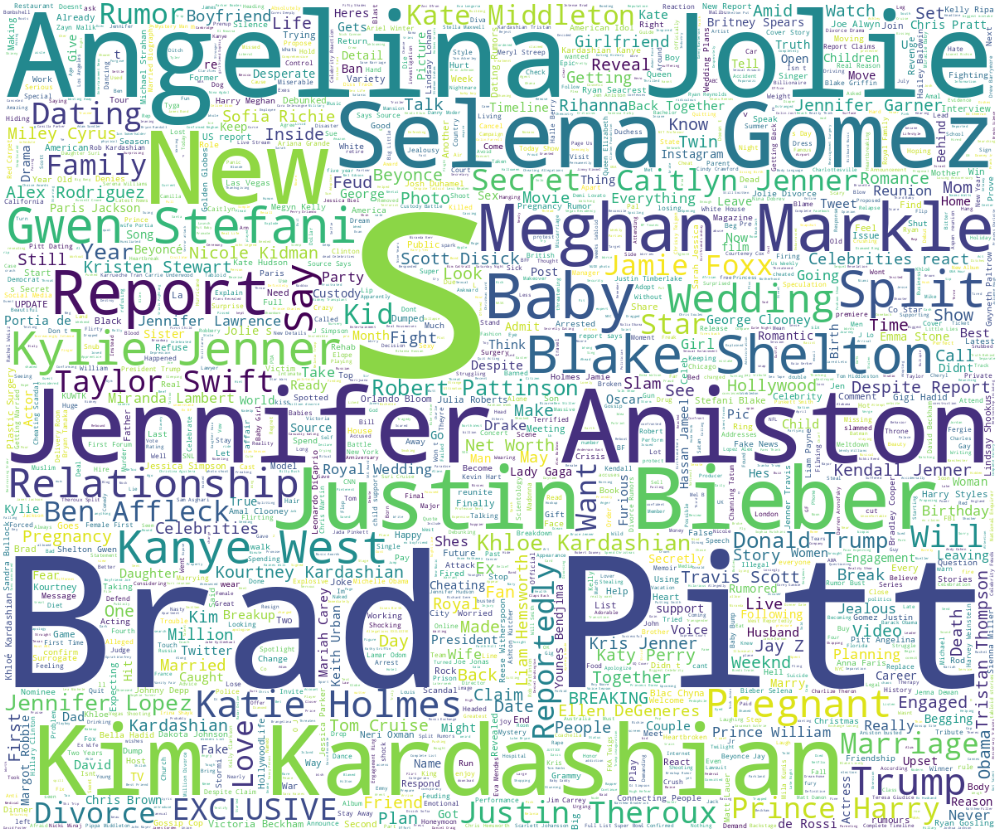

time: 32.2 s (started: 2023-06-11 10:18:18 +00:00)


In [ ]:
#Create a wordcloud for the fake news tiles
news = open ("/content/drive/MyDrive/2023-Projects/Competition/fake-news/fake_news_tile.txt").read().replace('\n',' ').replace('\'','') #Source

wordcloud = WordCloud(max_words=len(news),
                      stopwords=STOPWORDS,
                      background_color = 'white',
                      width=1200,
                      height=1000
                      ).generate(news)

fig = plt.figure(figsize=(50, 50))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()